In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import os

import numpy as np
from scipy.cluster.vq import kmeans, vq
from scipy.optimize import minimize
from sklearn.linear_model import Lasso, Ridge
from sklearn.cluster import SpectralClustering
from sklearn.decomposition import PCA

from scipy.spatial.distance import cdist
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.metrics import structural_similarity as ssim

In [2]:
import spgl1

K means clustering on tiles taken from an image

(384, 512)


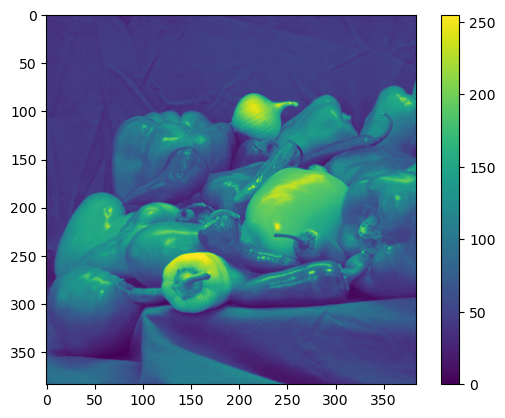

In [3]:
image_number = 3
tile_w = 16
step_size = 4 

results_dir = "results/overlapped_spgl_lasso/tilw%d_step%d_"%(tile_w,step_size)
if not os.path.exists(results_dir):
    os.makedirs(results_dir)
# dimensionality (N) of subspace = 64


image = cv2.imread(f"Dataset/Image{image_number}.png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
print(image.shape)
mindim = np.min(image.shape)
image = image[:mindim, :mindim]

plt.imshow(image)
plt.colorbar()
plt.savefig(os.path.join(results_dir, "image_%d.png"%(image_number)), bbox_inches='tight', pad_inches=0)
plt.show();

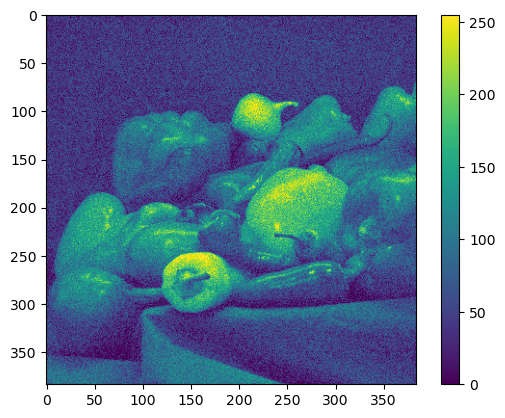

In [4]:
std_dev = 20
noisy_image = np.uint8(np.clip(image + np.random.normal(scale=std_dev, size=image.shape), 0, 255))
plt.imshow(noisy_image)
plt.colorbar()
plt.savefig(os.path.join(results_dir, "image_%d.png"%(image_number)), bbox_inches='tight', pad_inches=0)
plt.show();

In [5]:

def return_overlapping_tiles(image, tile_width, step_size):
    """
    image: A 2D array
    tile_width: the width of a square tile
    step_size: the number of pixels to move the window in both directions
    
    Returns:
    - tiles1d: Flattened patches from the image.
    - patch_count: 2D array where each element counts how many patches cover each pixel.
    """
    height, width = image.shape

    # Initialize an empty list to store the flattened patches
    tiles1d = []

    # Initialize a 2D array to count how many patches each pixel is part of
    patch_count = np.zeros_like(image, dtype=int)

    # Create overlapping tiles using a sliding window approach with step size
    for i in range(0, height - tile_width + 1, step_size):
        for j in range(0, width - tile_width + 1, step_size):
            # Extract the tile
            tile = image[i:i+tile_width, j:j+tile_width]
            
            # Flatten the tile and add to the list
            tiles1d.append(tile.flatten())

            # Increment the patch count for each pixel in the tile
            patch_count[i:i+tile_width, j:j+tile_width] += 1

    # Convert the list of tiles to a numpy array
    tiles1d = np.array(tiles1d)

    return tiles1d, patch_count

def reconstruct_image(imtiles1d, patch_count, tile_width, original_shape, step_size):
    """
    Reconstructs the 2D image from the processed imtiles1d patches.
    
    imtiles1d: The processed patches, same shape as original tiles1d.
    patch_count: 2D array with the count of patches each pixel is involved in.
    tile_width: Width of the square tile.
    original_shape: Shape of the original image (height, width).
    step_size: The number of pixels the window moves by in both directions.
    """
    height, width = original_shape

    # Initialize an empty array for the reconstructed image
    reconstructed_image = np.zeros((height, width), dtype=float)

    # Recreate the sliding window effect with step size
    patch_idx = 0
    for i in range(0, height - tile_width + 1, step_size):
        for j in range(0, width - tile_width + 1, step_size):
            # Reshape the 1D patch back to a 2D tile
            patch = imtiles1d[patch_idx].reshape(tile_width, tile_width)

            # Accumulate the patch values back into the reconstructed image
            reconstructed_image[i:i+tile_width, j:j+tile_width] += patch

            # Move to the next patch
            patch_idx += 1

    # Normalize the reconstructed image by dividing by patch_count to handle overlapping regions
    reconstructed_image /= patch_count

    return reconstructed_image

In [6]:
# The data vector
im_tiles1d, patch_count = return_overlapping_tiles(noisy_image, tile_w, step_size)
print(im_tiles1d.shape)
print(patch_count.shape)

(9025, 64)
(384, 384)


In [7]:
im_tiles1d = im_tiles1d.astype(float)

### Decide the number of clusters
* And if needed, change the num_clusters argument in the start 

In [8]:
# def calculate_inertia(data, centroids, cluster_indices):
#     # Calculate within-cluster sum of squared distances
#     # print(type(cluster_indices), cluster_indices.shape)
#     distances = np.sum((data - centroids[cluster_indices]) ** 2)
#     inertia = distances / len(data)
#     return inertia

# def elbow_method(data, max_clusters=32):
#     inertias = []

#     for num_clusters in range(2, max_clusters + 1):
#         centroids, distortion = kmeans(data, num_clusters)
#         cluster_indices, _ = vq(data, centroids)
#         inertia = calculate_inertia(data, centroids, cluster_indices)
#         inertias.append(inertia)

#     plt.plot(range(2, max_clusters + 1), inertias, marker='o')
#     plt.title('Elbow Curve for Optimal Number of Clusters')
#     plt.xlabel('Number of Clusters')
#     plt.ylabel('Average Inertia')
#     plt.show()

#     return inertias

# elbow_method(im_tiles1d, 32)

Can perform clustering with kmeans, if the number of clusters are decided beforehand.

In [9]:
# num_clusters = 20 
# def getKmeans(data, num_clusters):
#     # Adjust the number of clusters as needed
#     centroids, _ = kmeans(data, num_clusters)
#     print('data dimensions:', data.shape)
#     print('number of clusters:', num_clusters)
#     print('centroids shape:', centroids.shape)

#     #vector quatization
#     cluster_indices, _ = vq(data, centroids)
#     print('cluster_indices shape:', cluster_indices.shape)
#     return cluster_indices

# cluster_indices = getKmeans(im_tiles1d, num_clusters)

### Clustering more robustly, following the work of Candes,Sankoltanobi (2014)

I had another version of RobustSSCV4 earlier without an affine constraint, but just trying to see if I can get a better clustering by indirectly having the $\beta_i = 0$ subspace constraint (By removing eacg vector from the entire set )

In [10]:
# def getRobustSSCV6(Y, sigma):
"""
Robust Subspace Clustering: Candes, Sankoltanobi
Other solvers--> spgl1
without affine constraint
has beta_i = 0 constraint in a second way
https://spgl1.readthedocs.io/en/latest/api/generated/spgl1.spgl1.html
https://spgl1.readthedocs.io/en/latest/tutorials/spgl1.html#sphx-glr-tutorials-spgl1-py
"""
# Step 1: Compute sparse coefficients
Y = im_tiles1d
N, n = Y.shape
#3600,64


B = np.zeros((N, N))
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
for i in range(N):
    
    y_i = Y[i, :]
    
    # Remove the i-th row from Y
    y_others = np.delete(Y, i, axis=0)
    # print(y_others.shape) # (N-1,n) = 3599,64

    A = y_others.T # (n,N-1)
    b = y_i.T #(n,1)
    tau = 1
    # sigma = 100 #fixed sigma
    # sigma = 0.05 * np.linalg.norm(b, 2)
    sol_x, resid, grad, info = spgl1.spg_lasso(A, b,tau, verbosity=1)

    # print(type(sol_x)) --> <class 'numpy.ndarray'>
            
    result = np.array(sol_x).T
    # print(result.shape) # (3599,)

    if i%10 == 0:
        print('%.d th tile result:'%(i), file=output_file)
        print('L1 norm b', np.linalg.norm(b, 1), file=output_file)
        # print('Sigma', sigma)
        print('L1 norm x', np.linalg.norm(result, 1), file=output_file)
        print('sum of x', np.sum(result), file=output_file)
        print('L2 norm Ax-b', np.linalg.norm(A@result - b, 2), file=output_file)

    # CHECK THE COLUMN MAGNITUDES TO CHECK IF --> DO WE NEED TO MAKE UNIT NORM?
    # CHECK THE MISMATCH GETWEEN Ax and b, check |Ax-b|

    beta_i = np.insert(result, i, 0)  # Insert zero at the i-th position
    # print(beta_i.shape) # (3600,)

    B[i, :] = np.abs(beta_i)
    
# Checking beta value range--> very Large :(
print("checking rough beta range:",B[1], file=output_file)
output_file.close()

# Step 2: Construct similarity graph
W = np.abs(B) + np.abs(B.T)

# Step 3: Compute degree matrix
D = np.diag(np.sum(W, axis=1))

# Step 4: Compute normalized Laplacian
D_sqrt_inv = np.linalg.inv(np.sqrt(D))
L_norm = D_sqrt_inv @ (D - W) @ D_sqrt_inv

# Step 5: Compute the eigenvalues
eigenvalues, _ = np.linalg.eigh(L_norm)
sorted_eigenvalues = np.sort(eigenvalues)[::-1]
differences = np.diff(sorted_eigenvalues)
i_max = np.argmax(differences)
N = len(sorted_eigenvalues)
L_hat = N - (i_max + 1)

# To get the similarity matrix from the normalized Laplacian, we can use: S = I - L
S = np.eye(L_norm.shape[0]) - L_norm

# Step 6: Spectral clustering
spectral_clustering = SpectralClustering(n_clusters=L_hat, affinity='precomputed', random_state=0)
labels = spectral_clustering.fit_predict(W)
   
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print('Extimated_Clusters:', L_hat, file=output_file)
print('shape of labels:',labels.shape, file=output_file)

print('determinant of W similarity matrix:', np.linalg.det(W), file=output_file)
output_file.close()

# robust_cluster_indices = getRobustSSCV6(im_tiles1d, sigma=50)
# print('robust_cluster_indices shape:', robust_cluster_indices.shape)


SPGL1
No. rows              :       64     
No. columns           :     9024

Initial tau           : 1.00e+00     
Two-norm of b         : 3.03e+02

Optimality tol        : 1.00e-04     
Target one-norm of x  : 1.00e+00

Basis pursuit tol     : 1.00e-06     
Maximum iterations    :      640


ERROR EXIT -- Too many iterations

Products with A     :    1289        Total time   (secs) :     2.0
Products with A^H   :     641        Project time (secs) :     1.3
Newton iterations   :       0        Mat-vec time (secs) :     0.4
Line search its     :     648        Subspace iterations :       0

SPGL1
No. rows              :       64     
No. columns           :     9024

Initial tau           : 1.00e+00     
Two-norm of b         : 3.24e+02

Optimality tol        : 1.00e-04     
Target one-norm of x  : 1.00e+00

Basis pursuit tol     : 1.00e-06     
Maximum iterations    :      640


ERROR EXIT -- Too many iterations

Products with A     :    1242        Total time   (secs) :     1.8
Pro

In [11]:
print(L_hat)
print(labels.shape)

3411
(9025,)


In [12]:
# the shape of W is a square matrix (num_patches, num_patches) = (1024,1024)
# W.shape
im_tiles1d.shape

(9025, 64)

Debugging the simillarity matrix

determinant of W similarity matrix: 0.0


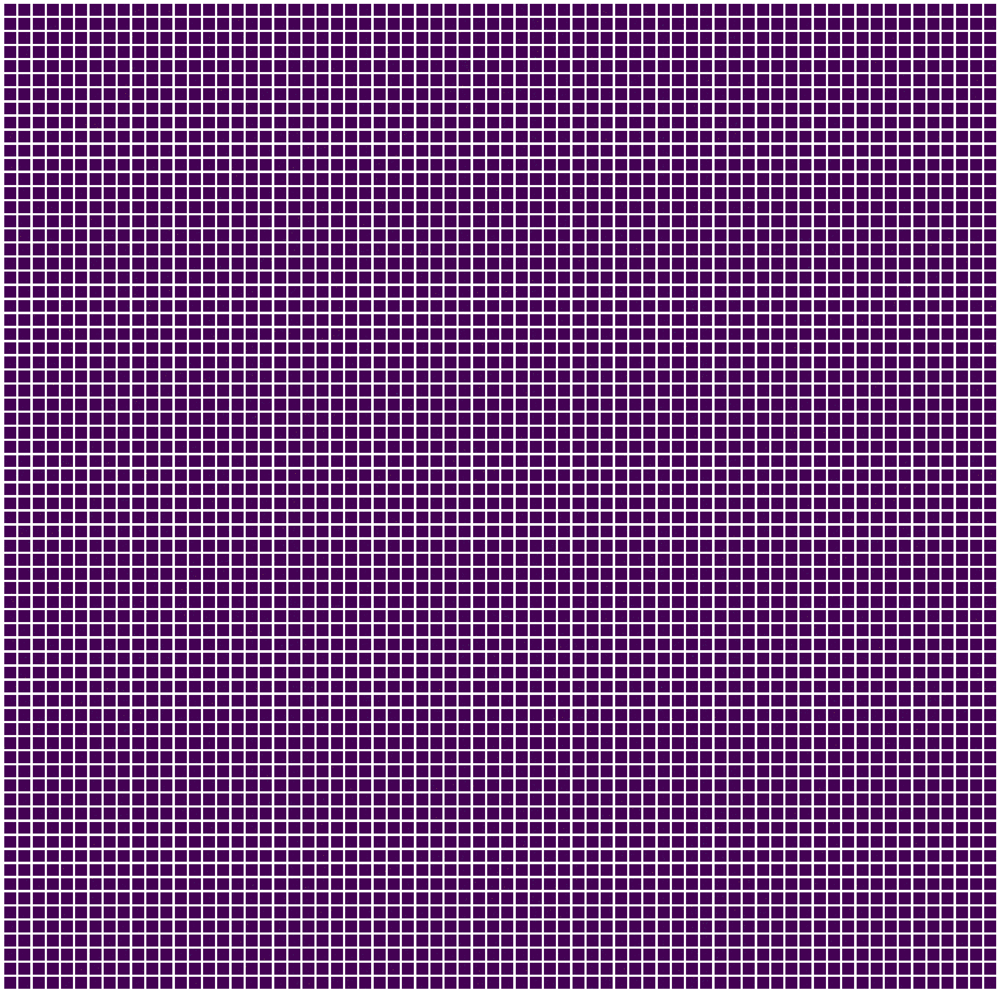

In [13]:
print('determinant of W similarity matrix:', np.linalg.det(W))
block_size = 128
block_cnt = int(im_tiles1d.shape[0]/block_size)
#8

#subplot with a grid of tiles
fig, axes = plt.subplots(block_cnt, block_cnt, figsize=(30, 30))

# Iterate through each tile and display
for i in range(block_cnt):
    for j in range(block_cnt):
        W_matrix = W[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size]
        normalized_W_matrix = (W_matrix - np.min(W_matrix)) / (np.max(W_matrix) - np.min(W_matrix))
        axes[i, j].imshow(normalized_W_matrix, cmap='viridis', interpolation='none')
        axes[i, j].axis('off')  # Turn off axis labels

plt.savefig(os.path.join(results_dir, "image_%d_similarities.png"%(image_number)))
plt.show()

determinant of W similarity matrix: 0.0


Text(0, 0.5, 'Frequency')

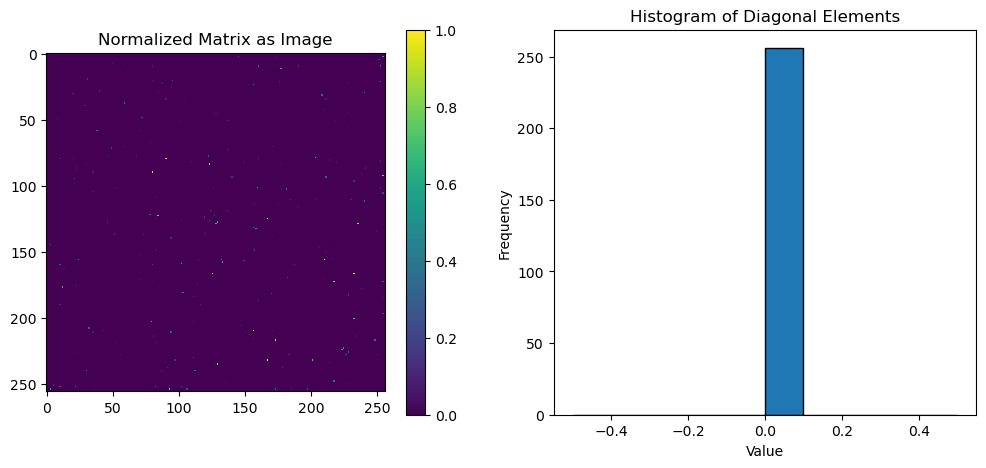

In [14]:
print('determinant of W similarity matrix:', np.linalg.det(W))
block_size = 256
W_matrix = W[:block_size,:block_size]

# print(W_matrix)

# Normalize the W_matrix to the range [0, 1]
normalized_W_matrix = (W_matrix - np.min(W_matrix)) / (np.max(W_matrix) - np.min(W_matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the W_matrix
diagonal_elements = np.diag(W_matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_W_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')

Edit the above single-block image to see if the choice of the "slice" of W has different patterns.
This confirms that the high similarity is NOT periodic on the patch number.
Now we need to find the row numbers that give these numbers.

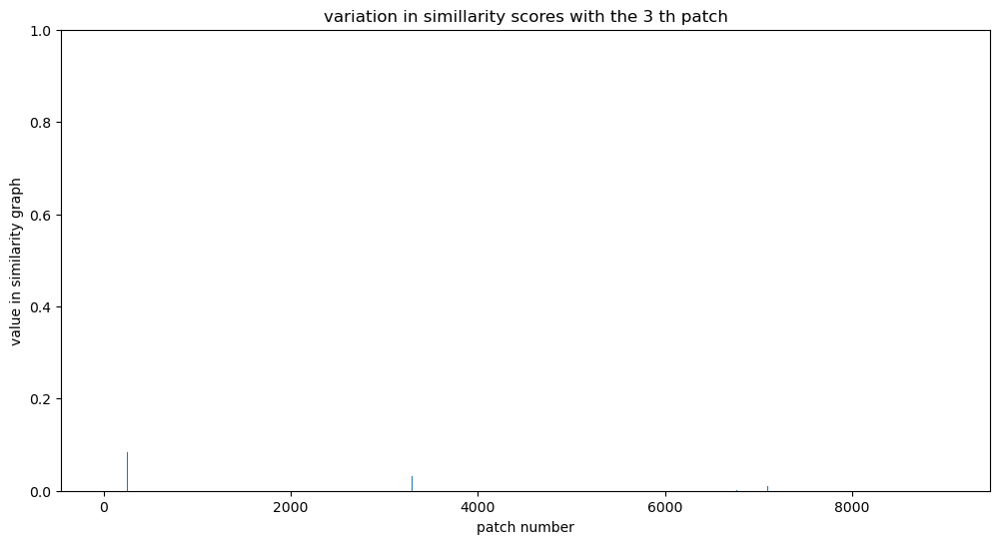

In [15]:
plt.figure(figsize=(12, 6))
patch_num_ex = 3
data = W[patch_num_ex,:]

#sorted values
top_count = 5
top_indices = np.argpartition(data, -top_count)[-top_count:]
top_indices = top_indices[np.argsort(data[top_indices])][::-1]

output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print("top %d similarities are in these indices in order"%(top_count) ,top_indices, file=output_file)
output_file.close()

plt.bar(range(len(data)), data)
plt.xlabel('patch number')
plt.ylabel('value in similarity graph')
plt.ylim(0, 1)
plt.title('variation in simillarity scores with the %d th patch'%(patch_num_ex))
plt.savefig(os.path.join(results_dir, "image_%d_similarity_w_%d th patch.png"%(image_number, patch_num_ex)))
plt.show()

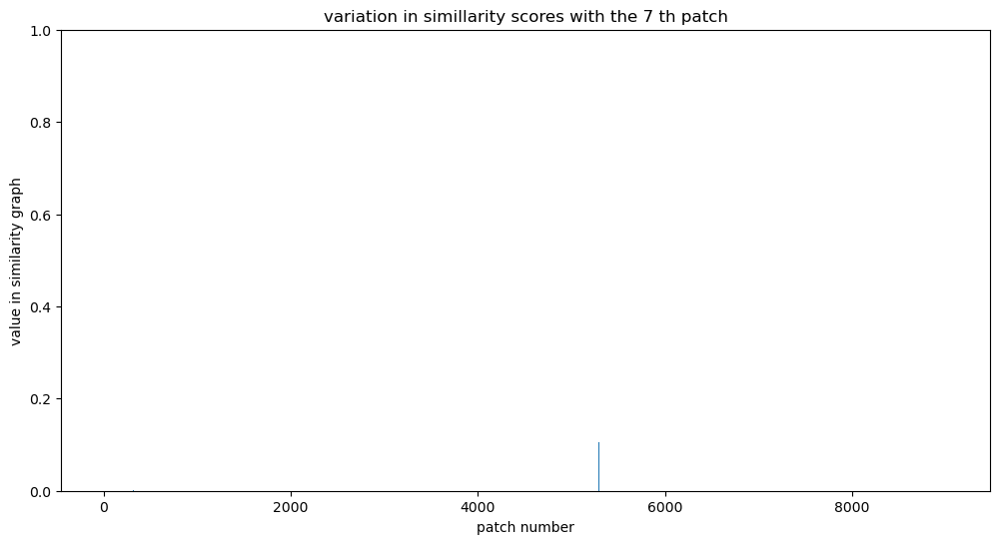

In [16]:
plt.figure(figsize=(12, 6))
patch_num_ex = 7
data = W[patch_num_ex,:]

#sorted values
top_count = 5
top_indices = np.argpartition(data, -top_count)[-top_count:]
top_indices = top_indices[np.argsort(data[top_indices])][::-1]
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print("top %d similarities are in these indices in order"%(patch_num_ex) ,top_indices, file=output_file)
output_file.close()


plt.bar(range(len(data)), data)
plt.xlabel('patch number')
plt.ylabel('value in similarity graph')
plt.ylim(0, 1)
plt.title('variation in simillarity scores with the %d th patch'%(patch_num_ex))
plt.savefig(os.path.join(results_dir, "image_%d_similarity_w_%d th patch.png"%(image_number, patch_num_ex)))
plt.show()

Looks like there are 3 clear patches that are common all throughout.
Can we visualise these 3 patches?

Be careful with the colorbar scale (vmin, vmax)

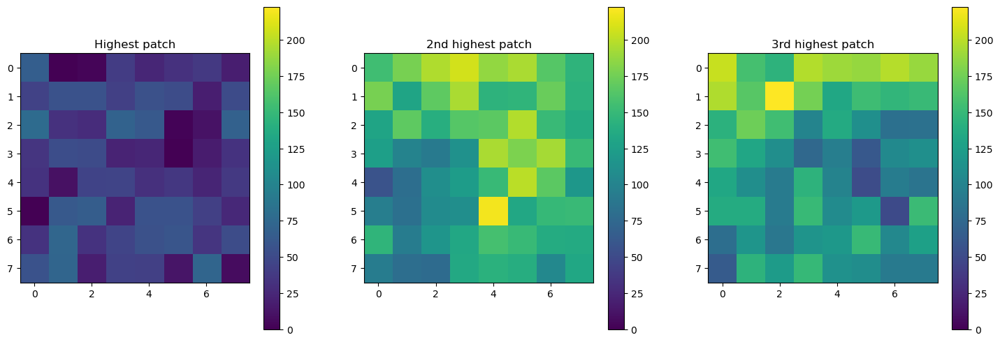

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
data1 = im_tiles1d[top_indices[0]]
data2 = im_tiles1d[top_indices[1]]
# data2 = im_tiles1d[15]
data3 = im_tiles1d[top_indices[2]]

# option 1
vmin = min(data1.min(), data2.min(), data3.min())
vmax = max(data1.max(), data2.max(), data3.max())

# option 2
# vmin = 0
# vmax = 255

img1 = axes[0].imshow(data1.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[0].set_title('Highest patch')

img2 = axes[1].imshow(data2.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[1].set_title('2nd highest patch')

img3 = axes[2].imshow(data3.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[2].set_title('3rd highest patch')

fig.colorbar(img1, ax=axes[0], orientation='vertical')
fig.colorbar(img2, ax=axes[1], orientation='vertical')
fig.colorbar(img3, ax=axes[2], orientation='vertical')
plt.savefig(os.path.join(results_dir, "image_%d_top3_similarity patches.png"%(image_number)))

To check if the behaviour is simillar with other patches as well: 
Is a random patch also having the same "visual detail" as the patches having high similarity?: 
Change the selection of the data and see. (Ive changed the index for data2)

Checking the index number of "interesting" patches- edges and black regions, and look at the numerical similarity.

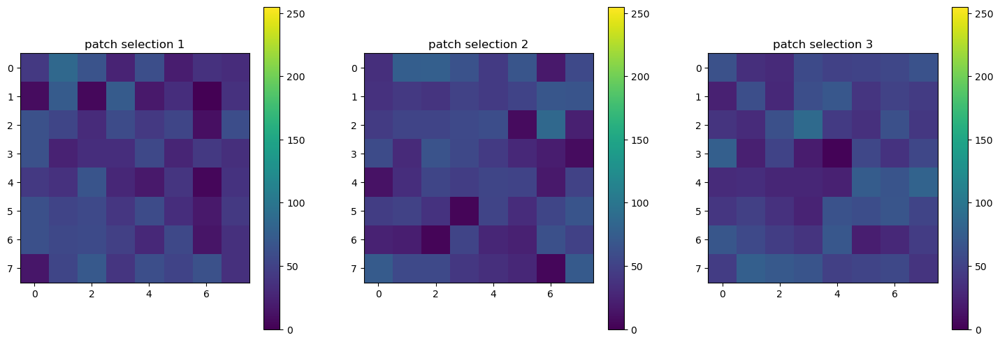

In [18]:
nice_indices = [10,300,330]
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
data1 = im_tiles1d[nice_indices[0]]
data2 = im_tiles1d[nice_indices[1]]
data3 = im_tiles1d[nice_indices[2]]

# option 1
# vmin = min(data1.min(), data2.min(), data3.min())
# vmax = max(data1.max(), data2.max(), data3.max())

# option 2
vmin = 0
vmax = 255

img1 = axes[0].imshow(data1.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[0].set_title('patch selection 1')

img2 = axes[1].imshow(data2.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[1].set_title('patch selection 2')

img3 = axes[2].imshow(data3.reshape(8,8), cmap='viridis', vmin=vmin, vmax=vmax)
axes[2].set_title('patch selection 3')

fig.colorbar(img1, ax=axes[0], orientation='vertical')
fig.colorbar(img2, ax=axes[1], orientation='vertical')
fig.colorbar(img3, ax=axes[2], orientation='vertical')
plt.savefig(os.path.join(results_dir, "image_%d_interesting patches.png"%(image_number)))

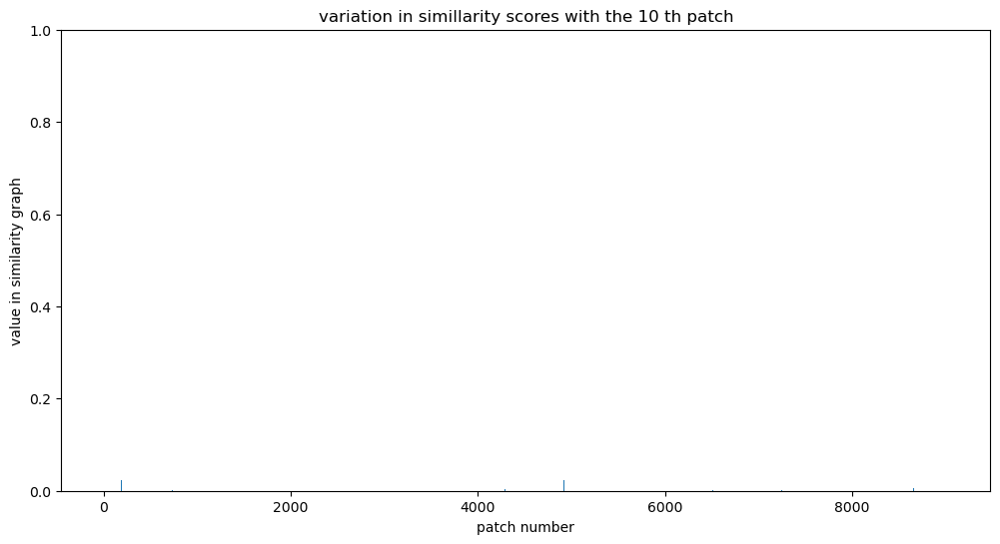

In [19]:
plt.figure(figsize=(12, 6))
patch_num_ex = 10
data = W[patch_num_ex,:]

#sorted values
top_count = 5
top_indices = np.argpartition(data, -top_count)[-top_count:]
top_indices = top_indices[np.argsort(data[top_indices])][::-1]
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print("top %d similarities are in these indices in order"%(patch_num_ex) ,top_indices, file=output_file)
output_file.close()

plt.bar(range(len(data)), data)
plt.xlabel('patch number')
plt.ylabel('value in similarity graph')
plt.ylim(0, 1)
plt.title('variation in simillarity scores with the %d th patch'%(patch_num_ex))
plt.savefig(os.path.join(results_dir, "image_%d_simil_w_patch_%d.png"%(image_number, patch_num_ex)))
plt.show()

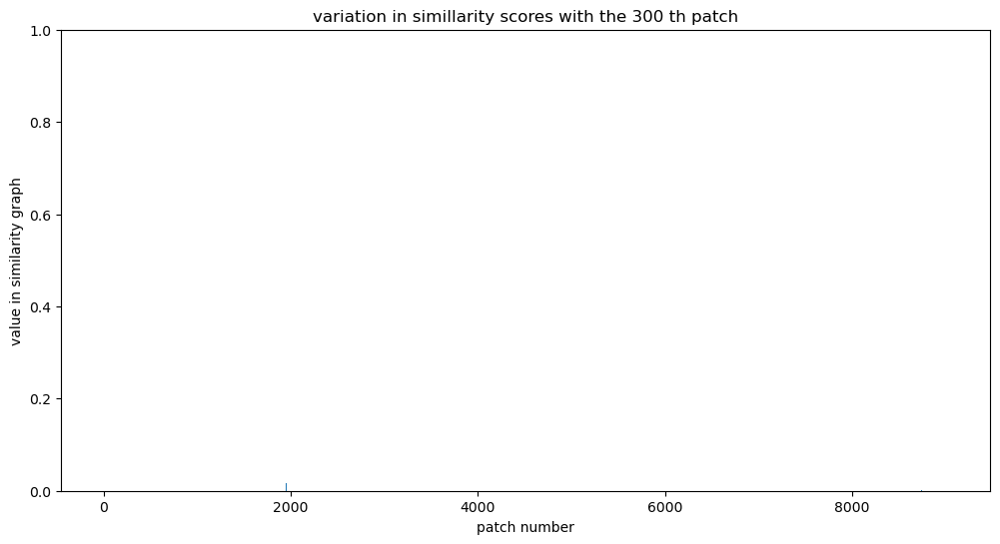

In [20]:
plt.figure(figsize=(12, 6))
patch_num_ex = 300
data = W[patch_num_ex,:]

#sorted values
top_count = 5
top_indices = np.argpartition(data, -top_count)[-top_count:]
top_indices = top_indices[np.argsort(data[top_indices])][::-1]
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print("top %d similarities are in these indices in order"%(patch_num_ex) ,top_indices, file=output_file)
output_file.close()


plt.bar(range(len(data)), data)
plt.xlabel('patch number')
plt.ylabel('value in similarity graph')
plt.ylim(0, 1)
plt.title('variation in simillarity scores with the %d th patch'%(patch_num_ex))
plt.savefig(os.path.join(results_dir, "image_%d_simil_w_patch_%d.png"%(image_number, patch_num_ex)))
plt.show()

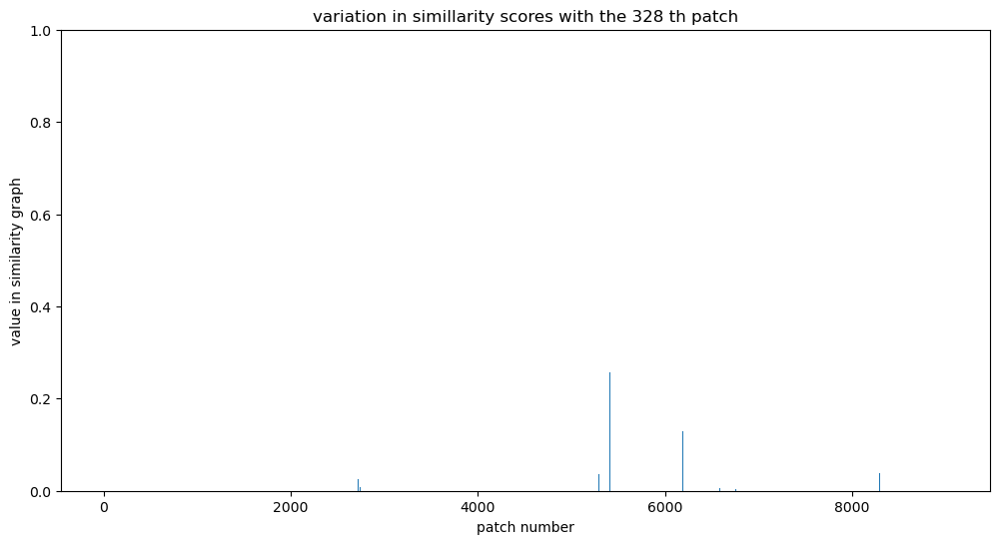

In [21]:
plt.figure(figsize=(12, 6))
patch_num_ex = 328
data = W[patch_num_ex,:]

#sorted values
top_count = 5
top_indices = np.argpartition(data, -top_count)[-top_count:]
top_indices = top_indices[np.argsort(data[top_indices])][::-1]
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print("top %d similarities are in these indices in order"%(patch_num_ex) ,top_indices, file=output_file)
output_file.close()


plt.bar(range(len(data)), data)
plt.xlabel('patch number')
plt.ylabel('value in similarity graph')
plt.ylim(0, 1)
plt.title('variation in simillarity scores with the %d th patch'%(patch_num_ex))
plt.savefig(os.path.join(results_dir, "image_%d_simil_w_patch_%d.png"%(image_number, patch_num_ex)))
plt.show()

Debugging the D matrix: There must be a 'zero' in the diagonal of the D matrix.

determinant of D sqrt inv: inf


c:\Users\thari\anaconda3\envs\FM\lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: overflow encountered in det
  r = _umath_linalg.det(a, signature=signature)


Text(0, 0.5, 'Frequency')

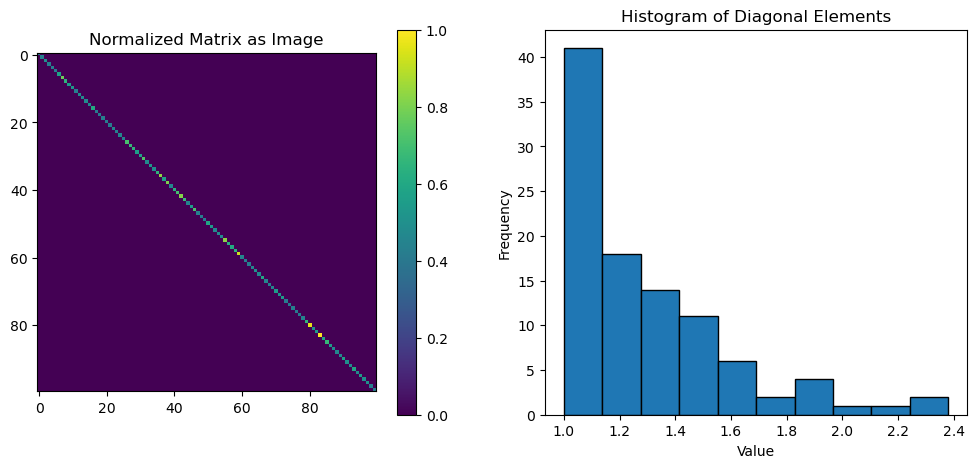

In [22]:
print('determinant of D sqrt inv:', np.linalg.det(D))
block = 100
matrix = D[:block,:block]
# print(matrix)

# Normalize the matrix to the range [0, 1]
normalized_matrix = (matrix - np.min(matrix)) / (np.max(matrix) - np.min(matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the matrix
diagonal_elements = np.diag(matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')


determinant of D_sqrt_inv: 0.0


Text(0, 0.5, 'Frequency')

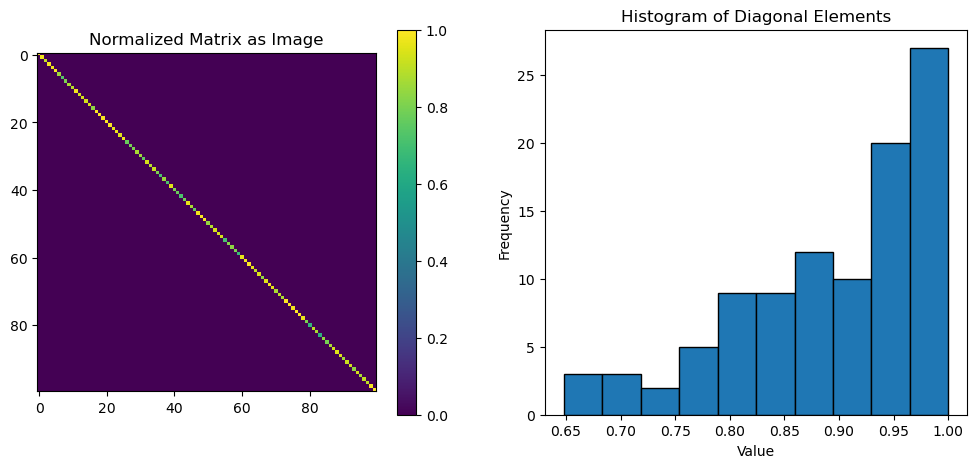

In [23]:
print('determinant of D_sqrt_inv:', np.linalg.det(D_sqrt_inv))
root_inv_matrix = D_sqrt_inv[:block,:block]
# print(root_inv_matrix)

# Normalize the root_inv_matrix to the range [0, 1]
normalized_root_inv_matrix = (root_inv_matrix - np.min(root_inv_matrix)) / (np.max(root_inv_matrix) - np.min(root_inv_matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the root_inv_matrix
diagonal_elements = np.diag(normalized_root_inv_matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_root_inv_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')


determinant of L_norm: 3.5386674918076246e-77


Text(0, 0.5, 'Frequency')

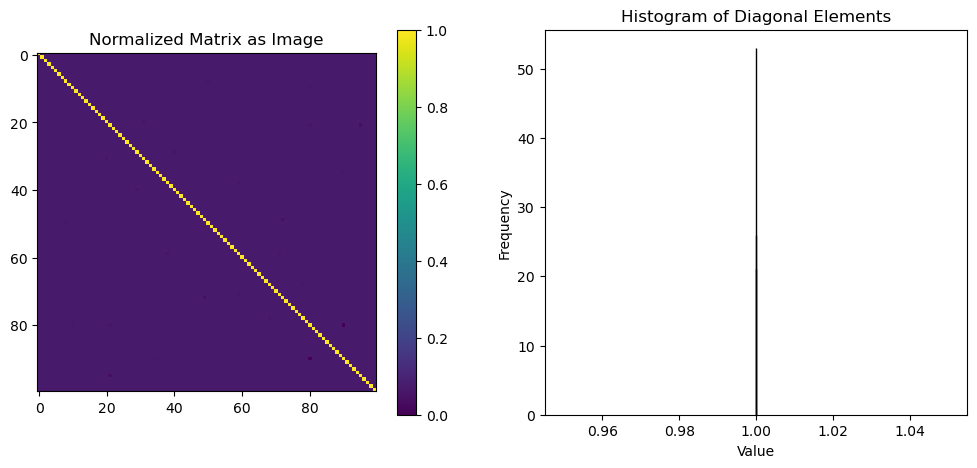

In [24]:
print('determinant of L_norm:', np.linalg.det(L_norm))
L_norm_matrix = L_norm[:block,:block]
# print(L_norm_matrix)

# Normalize the L_norm_matrix to the range [0, 1]
normalized_L_norm_matrix = (L_norm_matrix - np.min(L_norm_matrix)) / (np.max(L_norm_matrix) - np.min(L_norm_matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the L_norm_matrix
diagonal_elements = np.diag(normalized_L_norm_matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_L_norm_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')

determinant of S: 0.0


Text(0, 0.5, 'Frequency')

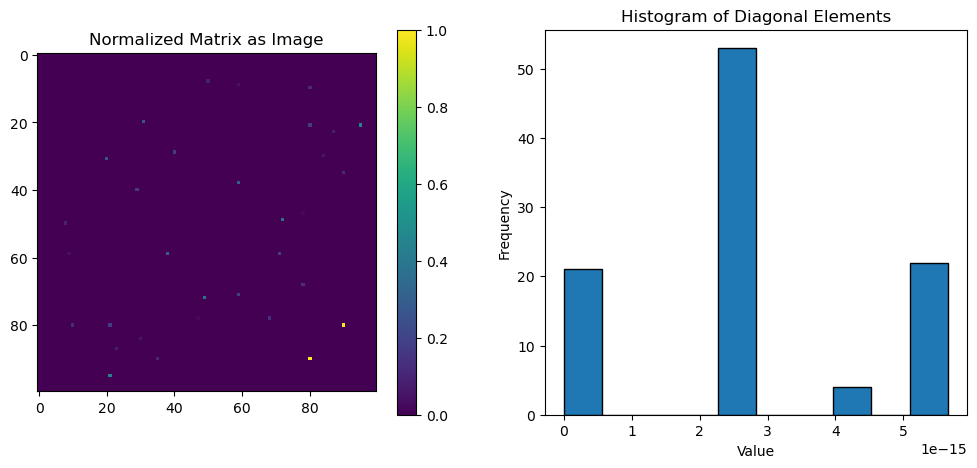

In [25]:
# To get the similarity matrix from the normalized Laplacian, we can use: S = I - L
S = np.eye(L_norm.shape[0]) - L_norm

print('determinant of S:', np.linalg.det(S))
S_matrix = S[:block,:block]
# print(S_matrix)

# Normalize the S_matrix to the range [0, 1]
normalized_S_matrix = (S_matrix - np.min(S_matrix)) / (np.max(S_matrix) - np.min(S_matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the S_matrix
diagonal_elements = np.diag(normalized_S_matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_S_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')

Using a library to get the normalized Laplacian

In [26]:
from scipy.sparse.csgraph import laplacian
L_norm_v2 = laplacian(W, normed=True)

# print(L_norm_v2)
print(L_norm_v2.shape)
print(np.max(L_norm_v2))
print(np.min(L_norm_v2))

print(np.sum(L_norm_v2 - np.eye(N)))
print(np.max(L_norm_v2 - np.eye(N)))
print(np.min(L_norm_v2 - np.eye(N)))

eigenvalues, _ = np.linalg.eigh(L_norm_v2)
# print(eigenvalues)

sorted_eigenvalues = np.sort(eigenvalues)[::-1]
print(sorted_eigenvalues)

differences = np.diff(sorted_eigenvalues)
i_max = np.argmax(differences)
k = len(sorted_eigenvalues)
print(k)

L_hat_v2 = k - (i_max + 1)
print("number of clusters predicted from L_norm_v2:", L_hat_v2)

# # Step 6: Spectral clustering
spectral_clustering = SpectralClustering(n_clusters=L_hat_v2, affinity='precomputed', random_state=0)
labels = spectral_clustering.fit_predict(W)

(9025, 9025)
1.0
-0.3124237237682953
-7875.2819056860735
0.0
-0.3124237237682953
[ 1.38409277e+00  1.38139771e+00  1.37519641e+00 ...  5.89883465e-01
  4.56862293e-01 -3.26363270e-16]
9025
number of clusters predicted from L_norm_v2: 3411


determinant of L_norm_v2: 7.525197588048494e-77


Text(0, 0.5, 'Frequency')

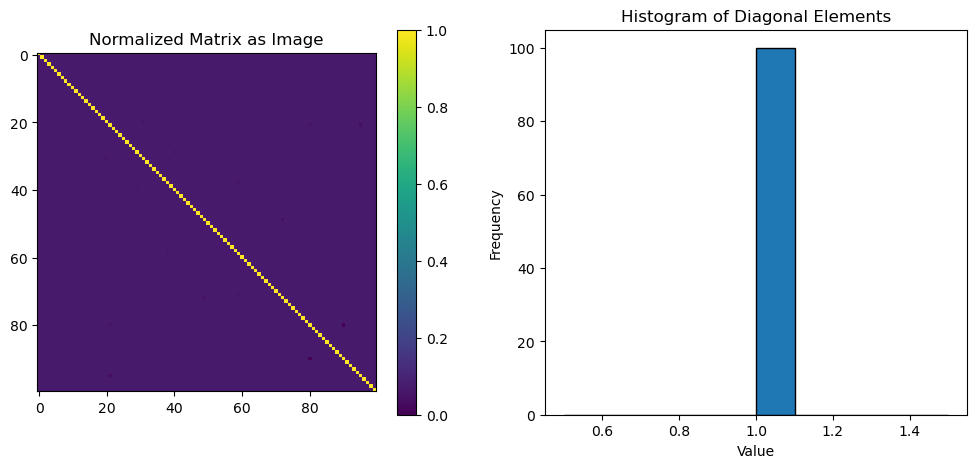

In [27]:
print('determinant of L_norm_v2:', np.linalg.det(L_norm_v2))
L_norm_v2_matrix = L_norm_v2[:block,:block]
# print(L_norm_v2_matrix)

# Normalize the L_norm_v2_matrix to the range [0, 1]
normalized_L_norm_v2_matrix = (L_norm_v2_matrix - np.min(L_norm_v2_matrix)) / (np.max(L_norm_v2_matrix) - np.min(L_norm_v2_matrix))
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

#diagonal elements of the L_norm_v2_matrix
diagonal_elements = np.diag(normalized_L_norm_v2_matrix)

# Plot the normalized matrix with a colorbar
cax = axs[0].imshow(normalized_L_norm_matrix, cmap='viridis', interpolation='none')
fig.colorbar(cax, ax=axs[0])
axs[0].set_title('Normalized Matrix as Image')

# Plot the histogram of the diagonal elements
axs[1].hist(diagonal_elements, bins=10, edgecolor='black')
axs[1].set_title('Histogram of Diagonal Elements')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')

Just check if the number of clusters recommended is a bit too much?

In [28]:
print(labels.shape)
Spectral_cluster_indices = labels
num_clusters = L_hat_v2

(9025,)


select the cluster indices

In [29]:
# cluster_indices = getSpectralCluster(im_tiles1d, num_clusters)

Arranging clusters, means and medoids

In [30]:
def calculate_medoid(cluster):
    """
    cluster: an mxN array of m vectors in a cluster
    """
    # Pairwise distances between points in the cluster
    distances = cdist(cluster, cluster, metric='euclidean')
    total_distances = np.sum(distances, axis=1)
    medoid_index = np.argmin(total_distances)

    # Medoid is the data point with the minimum total distance
    medoid = cluster[medoid_index]

    return medoid

def get_cluster_medoids(data, cluster_indices):
    """
    Inputs:
    data: an mxN array of m data vectors (points)
    cluster_indices: an mx1 array of m cluster indices

    Returns:
    clusters: a dictionary, indexed by cluster number and values are clustered arrays of data
    medoids: a dictionary, indexed by cluster number and values are the medoid data vector
    means: a dictionary, indexed by cluster number and values are means
    
    """
    unique_clusters = np.unique(cluster_indices)

    # Initialise a dictionary to store clusters
    clusters = {cluster: [] for cluster in unique_clusters}

    # Populate clusters dictionary with data points
    for i, cluster_index in enumerate(cluster_indices):
        clusters[cluster_index].append(data[i])

    # Calculate medoid for each cluster
    medoids = {cluster: calculate_medoid(np.array(points)) for cluster, points in clusters.items()}
    means = {cluster: np.mean(np.array(points), axis=0) for cluster, points in clusters.items()}

    return clusters, medoids, means

Centred Clusters

In [31]:
clustered_data, cluster_medoids, cluster_means = get_cluster_medoids(im_tiles1d, Spectral_cluster_indices)
print ('keys of clustered_data:' ,clustered_data.keys())
print ('clustered_data[0] has shape' ,np.array(clustered_data[0]).shape)
print('cluster_medoids[0]  has shape', cluster_medoids[0].shape)
print ('cluster_means[0] has shape' , cluster_means[0].shape)

def get_centered_clusters(clustered_data, cluster_means):
    centered_clusters = {cluster: (np.array(clustered_data[cluster])-cluster_means[cluster]) for cluster in clustered_data.keys()}
    return centered_clusters

centered_clusters = get_centered_clusters(clustered_data, cluster_means)

keys of clustered_data: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 

In [32]:
#check for mean zero--> checked
summa = 0
for i in range(num_clusters):
    summa += centered_clusters[i].sum()
print (summa)

5.239186862127099e-11


In [33]:
def pca_for_cluster(cluster):
    """ 
    Inputs:
    cluster- mxN centered array of vectors from a single cluster

    Returns:
    cluster_pca
    """
    assert isinstance(cluster, np.ndarray)

    pca = PCA()
    cluster_pca = pca.fit_transform(cluster)
    pca_vectors = pca.components_
    # print('pca vectors shape:', pca_vectors.shape)


    #padding to make the cumsum array have data_dim(8x8=64) length
    data_dim = cluster.shape[-1] 
    padding_size = max(0, data_dim - len(pca.explained_variance_ratio_))
    expl_var_ratio_cumul = np.cumsum(np.pad(pca.explained_variance_ratio_, (0, padding_size), 'constant', constant_values=0))

    return cluster_pca, expl_var_ratio_cumul, pca_vectors

#test pca function
cluster_pca, expln_var_cum, pca_vectors = pca_for_cluster(centered_clusters[0])
print(type(cluster_pca), cluster_pca.shape)
print(pca_vectors.shape)


<class 'numpy.ndarray'> (1, 1)
(1, 64)


c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)


Showing how much of variability is explained by each cluster's PCA vectors

In [34]:
num_clusters = len(centered_clusters)

# When num_clusters is large, the figure size gets too large. SO scrapping this image for now
# fig, axs = plt.subplots(nrows= num_clusters, ncols =1, figsize=(8,4* num_clusters))

#clusters_pcavectors and mean- a set basis(psi), one for each cluster
t_exp = 0.9
dynamic_psi = dict()
fixed_psi = dict()
dim_comp = 0.5
fixed_cut = int(dim_comp* np.square(tile_w))

for i, (cluster_key, points) in enumerate(centered_clusters.items()):
    cluster_pca, expln_var_cum, pca_vectors = pca_for_cluster(points)

    # find the index that reaches 0.9 cumsum variability
    cutidx = np.argmax(expln_var_cum >= t_exp)
    dynamic_basis = np.vstack((np.array([cluster_means[cluster_key]]), pca_vectors[:cutidx]))
    fixed_basis = np.vstack((np.array([cluster_means[cluster_key]]), pca_vectors[:fixed_cut]))

    # Add the dynamic_basis vectors describing the 0.9 variance
    dynamic_psi[cluster_key] = dynamic_basis

    # Add the fixed_basis vectors which are the 50% of the the basis vectors
    fixed_psi[cluster_key] = fixed_basis

    print('Cluster %d dynamic_basis vectors shape:'%(cluster_key), dynamic_basis.shape)
    print('Cluster compression when pruning %.2f variance is %.4f'%(t_exp, dynamic_basis.shape[0]/points.shape[0]))
    print('--------------------')
                      
    # axs[i].plot(range(1, len(expln_var_cum) + 1), expln_var_cum, label='Cluster no.%d with %d vectors'%(cluster_key, points.shape[0]))
    # axs[i].set_xlabel('Number of Components')
    # axs[i].set_ylabel('Cumultiv Explained Var Ratio')
    # axs[i].legend()

# plt.savefig('results/Patching_Image_%d.pdf'%(image_number))
# plt.show()

Cluster 0 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.4000
--------------------
Cluster 2 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.3333
--------------------
Cluster 3 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 4 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 5 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 6 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 7 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------


c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

 (9, 64)
Cluster compression when pruning 0.90 variance is 0.3333
--------------------
Cluster 236 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 237 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 238 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 239 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 240 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 241 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 242 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 243 dynamic_basi

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 610 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 611 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 612 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 613 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 614 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 615 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 616 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 617 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
-----

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 897 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 898 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 899 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 900 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 901 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 902 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 903 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 904 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
-----

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 1247 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1248 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1249 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1250 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 1251 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.3333
--------------------
Cluster 1252 dynamic_basis vectors shape: (3, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1253 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1254 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.00

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 1570 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1571 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1572 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1573 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1574 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1575 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1576 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1577 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.66

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 1865 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 1866 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1867 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1868 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1869 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 1870 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1871 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 1872 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.00

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 2181 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2182 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2183 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 2184 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2185 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2186 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2187 dynamic_basis vectors shape: (2, 64)
Cluster compression when pruning 0.90 variance is 0.6667
--------------------
Cluster 2188 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.00

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 2534 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2535 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 2536 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2537 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2538 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.5000
--------------------
Cluster 2539 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2540 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2541 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.00

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 2861 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2862 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2863 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2864 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2865 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2866 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2867 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 2868 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.00

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Cluster 3147 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3148 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3149 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3150 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3151 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3152 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3153 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 1.0000
--------------------
Cluster 3154 dynamic_basis vectors shape: (1, 64)
Cluster compression when pruning 0.90 variance is 0.50

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)
c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomp

Approximate $\hat{x}$ for each data point inside the cluster

In [35]:
# Approximate x_hat = Psi_k alpha; for each tile x_hat
def fit_to_basis(data_vectors, basis_vectors):
    """ 
    basis_vectors : an nxN array with a basis vector(N-dimensional) in each row 
    data_vectors : an mxN array with m examples of (N-dimensional) data.
    """ 
    projection_matrix = basis_vectors.T @ (np.linalg.pinv(basis_vectors @ basis_vectors.T) @ basis_vectors)
    approximations = data_vectors @ projection_matrix
    errors = np.linalg.norm(data_vectors - approximations , axis=1)
    # print(errors.shape)
    return approximations, errors

 cluster 0 has error after fitting: 
 dynamic basis selection: 0.0000 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 1 has error after fitting: 
 dynamic basis selection: 128.8662 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 2 has error after fitting: 
 dynamic basis selection: 136.7423 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 3 has error after fitting: 
 dynamic basis selection: 83.2458 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 4 has error after fitting: 
 dynamic basis selection: 76.5129 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 5 has error after fitting: 
 dynamic basis selection: 77.1497 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 6 has error after fitting: 
 dynamic basis selection: 85.6295 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 7 has error after fitting: 
 dynamic basis selection: 90.6951 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 8 has error after fitting: 
 dynamic basis selection: 0.0000 
 fixed top 0.50: 0.0000 
 ------ 
 cluster 9 has error after fitting: 
 dynamic 

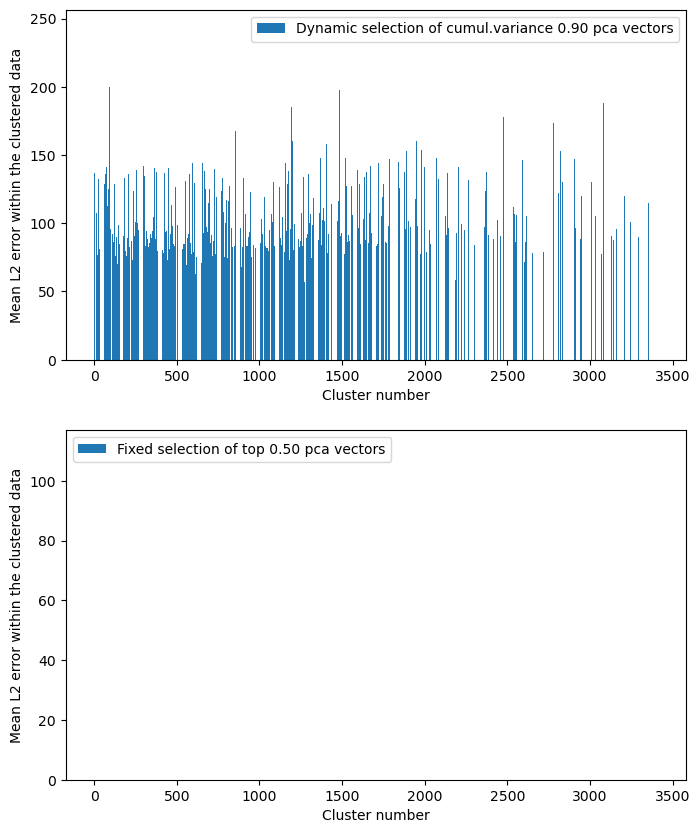

In [36]:
dyn_errors = []
fix_errors = []
for i, (cluster_key, points) in enumerate(clustered_data.items()):
    dyn_approx, dyn_errs = fit_to_basis(clustered_data[cluster_key], dynamic_psi[cluster_key])
    fix_approx, fix_errs = fit_to_basis(clustered_data[cluster_key], fixed_psi[cluster_key])
    dyn_errors.append(np.mean(dyn_errs))
    fix_errors.append(np.mean(fix_errs))
    print(" cluster %d has error after fitting: \n dynamic basis selection: %.4f \n fixed top %.2f: %.4f \n ------ "%(i, np.mean(dyn_errs), dim_comp, np.mean(fix_errs)))

# print(np.array(dyn_errors).shape)

fig, axs = plt.subplots(nrows= 2, ncols =1, figsize=(8,10))
axs[0].bar(np.array(range(num_clusters)), dyn_errors, label='Dynamic selection of cumul.variance %.2f pca vectors'%(t_exp))
axs[0].set_xlabel('Cluster number')
axs[0].set_ylabel('Mean L2 error within the clustered data')
axs[0].legend()

axs[1].bar(range(num_clusters), fix_errors, label='Fixed selection of top %.2f pca vectors'%(dim_comp))
axs[1].set_xlabel('Cluster number')
axs[1].set_ylabel('Mean L2 error within the clustered data')
axs[1].legend()

### Approximate $\hat{x}$ for each $x$ datapoint in the original tiles1d so that I can recreate the image.

In [37]:
print('1D data array shape:',im_tiles1d.shape)
print('cluster indices shape',Spectral_cluster_indices.shape)


1D data array shape: (9025, 64)
cluster indices shape (9025,)


In [39]:
def visualise_approx(im_tiles1d, cluster_indices):
    approx_data1d = np.zeros_like(im_tiles1d)
    error_data = np.zeros_like(im_tiles1d)
    for i in range(len(cluster_indices)):
        fix_approx, fix_errs = fit_to_basis(im_tiles1d[i][np.newaxis,:],fixed_psi[cluster_indices[i]])
        approx_data1d[i] = fix_approx
        error_data[i] = fix_errs

    num_tiles_x = mindim
    num_tiles_y = mindim

    original_shape = num_tiles_x, num_tiles_y

    tile_width = tile_w
    tile_height = tile_w

    approx_image = reconstruct_image(approx_data1d, patch_count, tile_width, original_shape, step_size)
    # approx_data2d = approx_data1d.reshape(num_tiles_x, num_tiles_x, tile_width, tile_height)
    # approx_image = approx_data2d.transpose(0, 2, 1, 3).reshape(num_tiles_y*tile_height, num_tiles_x*tile_width)

    return approx_image

approx_image = visualise_approx(im_tiles1d, Spectral_cluster_indices)

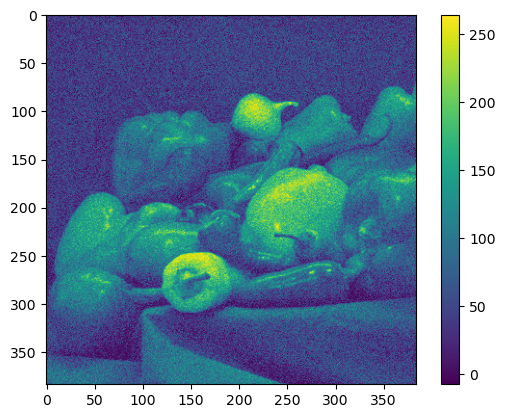

In [40]:
plt.imshow(approx_image)
plt.colorbar()
plt.show()

In [41]:
MSE = np.mean(np.square(approx_image.astype(np.float32) - image.astype(np.float32)))
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print('MSE:', MSE, file=output_file)
output_file.close()

In [42]:
PSNR =cv2.PSNR(image.astype(np.float32), approx_image.astype(np.float32))
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print('PSNR:', PSNR, file=output_file)
output_file.close()

In [43]:
ssim_value, ssim_map = ssim(approx_image.astype(np.float32), image.astype(np.float32), full=True)
output_file = open(results_dir+'/image_%d prints.txt'%(image_number), 'a')
print('SSIM:', ssim_value, file=output_file)
output_file.close()

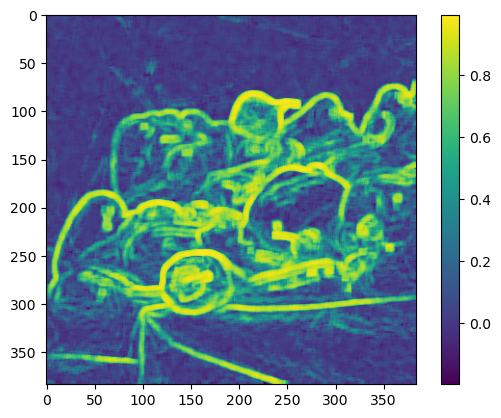

In [44]:
plt.imshow(ssim_map)
plt.colorbar()
plt.savefig(os.path.join(results_dir, "image_%d_SSIM_Map.png"%(image_number)))
plt.show()

The code below compares only the Kmeans clustering as the clustering algorithm

### One function to rule them all :p

In [ ]:
%%skip
def clusterdenoising(image, tile_w, num_clusters, t_ratio=0.5):
    """
    Inputs: An image to be denoised, tile width, number of PCA clusters
    Outputs: A cluster approximated image using to t_ratio of PCA vectors
    """
    im_tiles2d, im_tiles1d = return_overlapping_tiles(image, tile_w)
    im_tiles1d = im_tiles1d.astype(float)

    centroids, _ = kmeans(im_tiles1d, num_clusters)
    # print('data dimensions:', im_tiles1d.shape)
    # print('number of clusters:', num_clusters)
    # print('centroids shape:', centroids.shape)

    #vector quatization
    cluster_indices, _ = vq(im_tiles1d, centroids)
    # print('cluster_indices shape:', cluster_indices.shape)

    clustered_data, cluster_medoids, cluster_means = get_cluster_medoids(im_tiles1d, cluster_indices)
    # print ('keys of clustered_data:' ,clustered_data.keys())
    # print ('clustered_data[0] has shape' ,np.array(clustered_data[0]).shape)
    # print('cluster_medoids[0]  has shape', cluster_medoids[0].shape)
    # print ('cluster_means[0] has shape' , cluster_means[0].shape)

    centered_clusters = get_centered_clusters(clustered_data, cluster_means)

    t_exp = 0.9
    dynamic_psi = dict()
    fixed_psi = dict()
    dim_comp = t_ratio
    fixed_cut = int(dim_comp* np.square(tile_w))

    for i, (cluster_key, points) in enumerate(centered_clusters.items()):
        cluster_pca, expln_var_cum, pca_vectors = pca_for_cluster(points)

        # find the index that reaches 0.9 cumsum variability
        cutidx = np.argmax(expln_var_cum >= t_exp)
        dynamic_basis = np.vstack((np.array([cluster_means[cluster_key]]), pca_vectors[:cutidx]))
        fixed_basis = np.vstack((np.array([cluster_means[cluster_key]]), pca_vectors[:fixed_cut]))

        # Add the dynamic_basis vectors describing the 0.9 variance
        dynamic_psi[cluster_key] = dynamic_basis

        # Add the fixed_basis vectors which are the 50% of the the basis vectors
        fixed_psi[cluster_key] = fixed_basis


    approx_data2d, approx_image = visualise_approx(im_tiles1d, cluster_indices)
    return approx_data2d, approx_image

UsageError: Cell magic `%%skip` not found.


In [ ]:
# _ , approx_image = clusterdenoising(image,tile_w=8,num_clusters=20,t_ratio=0.5)

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)


In [ ]:
# def compareNLM(image_number):
#     image = cv2.imread(f"Dataset/Image{image_number}.png")
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     mindim = np.min(image.shape)
#     image = image[:mindim, :mindim]

#     # Define Gaussian noise levels
#     noise_levels = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]

#     # Create a plot to display images
#     plt.figure(figsize=(15, 8))

#     #NLM args
#     patch_kw = dict(patch_size=8,      # 8x8 patches
#                     patch_distance=6,  # 13x13 search area
#                     channel_axis=-1)

#     mse_NLM = []
#     mse_ours= []

#     # Plot noisy images and denoised images
#     for i, noise_level in enumerate(noise_levels):
#         # Add Gaussian noise to the original image
#         noisy_image = np.uint8(np.clip(image + np.random.normal(scale=noise_level, size=image.shape), 0, 255))
        
#         # Denoise the noisy image (replace this with your denoising algorithm)
#         _,ours_denoised = clusterdenoising(noisy_image,tile_w=8,num_clusters=20,t_ratio=0.5)

#         #NLM Slow
#         noisy_image_NLM = noisy_image[:,:, np.newaxis]
#         sigma_est = np.mean(estimate_sigma(noisy_image_NLM, channel_axis=-1))
#         NLM_denoised = (denoise_nl_means(noisy_image_NLM, h=0.7 * sigma_est, fast_mode=False,
#                             **patch_kw) * 255).astype(np.uint8)

#         mse_NLM.append(np.mean(np.square(NLM_denoised-image)))
#         mse_ours.append(np.mean(np.square(ours_denoised-image)))

#         # Plot the noisy image
#         plt.subplot(3, 10, i + 1)
#         plt.imshow(noisy_image)
#         plt.title(f'Noisy (σ={noise_level})')
#         plt.axis('off')

#         # Plot the denoised image
#         plt.subplot(3, 10, i + 11)
#         plt.imshow(NLM_denoised)
#         plt.title(f'AfterNLM (σ={noise_level})')
#         plt.axis('off')
        
#         # Plot the denoised image
#         plt.subplot(3, 10, i + 21)
#         plt.imshow(ours_denoised)
#         plt.title(f'Ours (σ={noise_level})')
#         plt.axis('off')

#     plt.tight_layout()
#     plt.savefig('results/LASSO_Spectral_OursvsNLM_Image_%d_GaussianNoise.png'%(image_number))
    
#     plt.figure(figsize=(10, 6))
#     plt.plot(noise_levels, mse_NLM, marker='o', label='NLM')
#     plt.plot(noise_levels, mse_ours, marker='o', label='Ours')
#     plt.title('MSE Losses for Denoising Methods')
#     plt.xlabel('Noise Level')
#     plt.ylabel('MSE Loss')
#     plt.xticks(noise_levels)
#     plt.grid(True)
#     plt.legend()
#     plt.savefig('results/LASSO_Spectral_OursvsNLM_Image_%d_GaussianNoise_MSE.png'%(image_number))
    

c:\Users\thari\anaconda3\envs\FM\lib\site-packages\sklearn\decomposition\_pca.py:541: RuntimeWarning: invalid value encountered in divide
  explained_variance_ = (S**2) / (n_samples - 1)


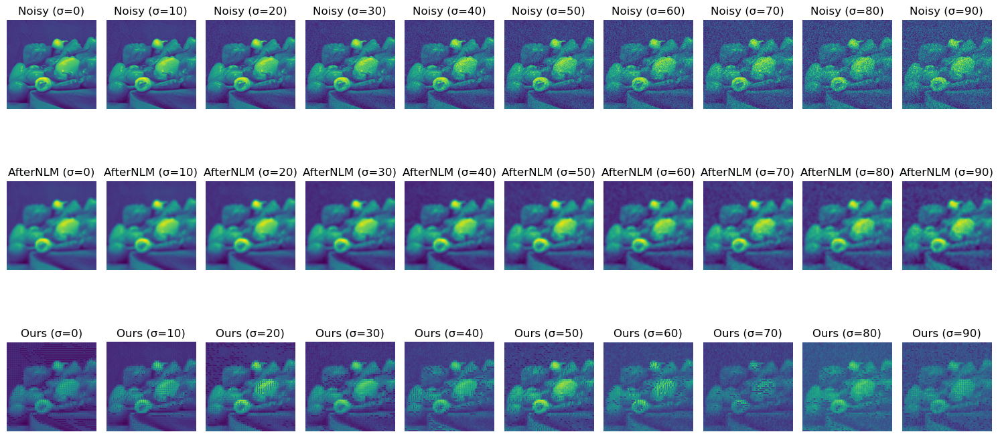

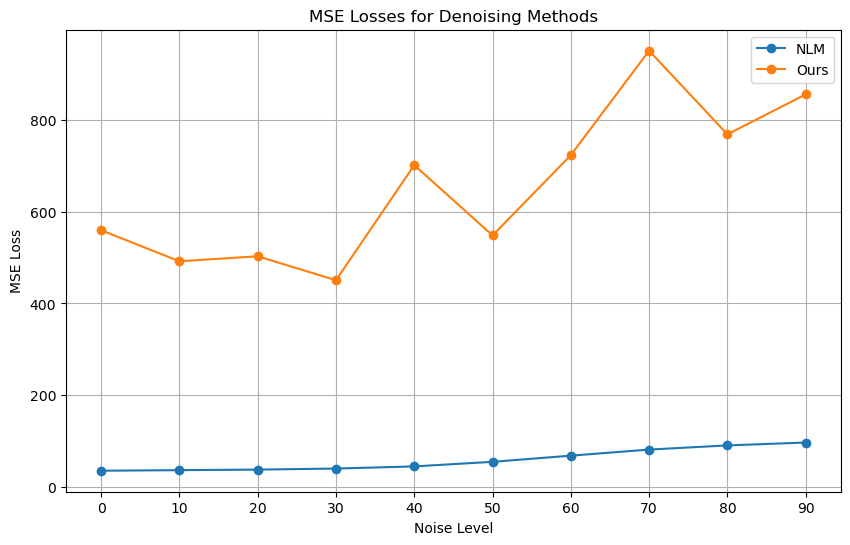

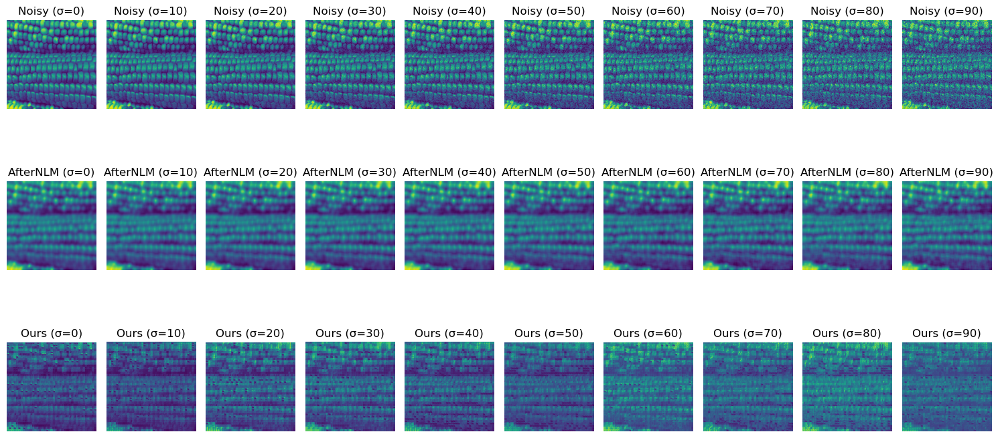

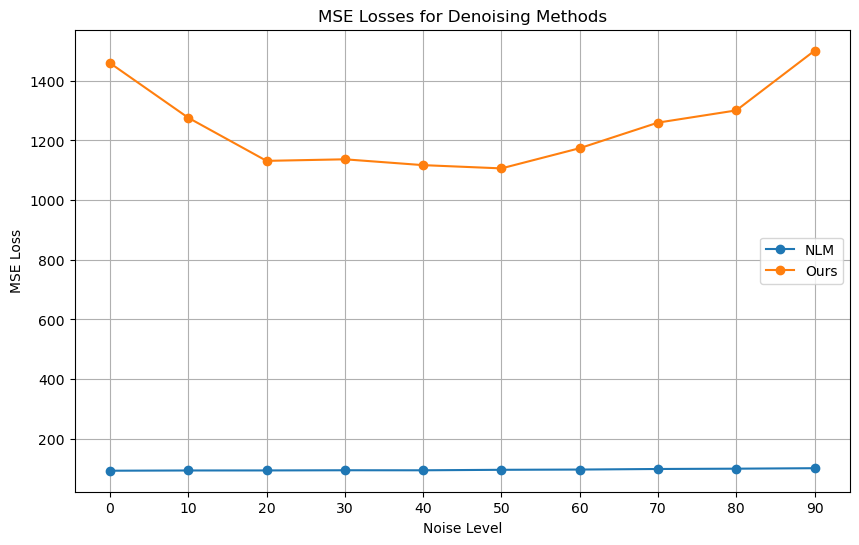

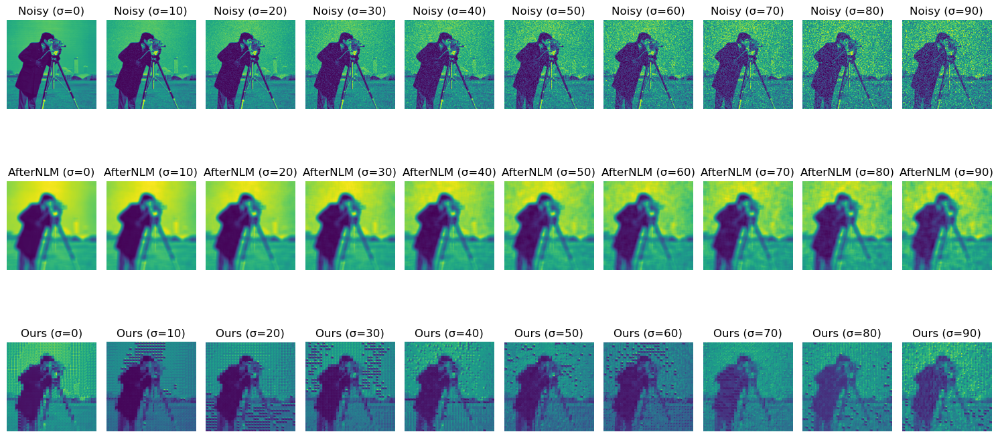

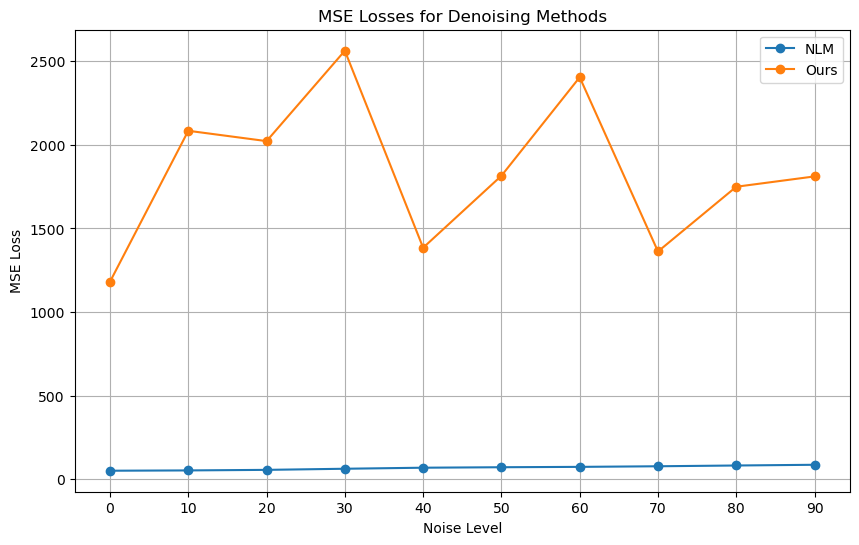

In [ ]:
# for image_num in range(1,4):
#     compareNLM(int(image_num))

In [ ]:
# #Sanity check
# #NLM args
# patch_kw = dict(patch_size=8,      # 5x5 patches
#                 patch_distance=6,  # 13x13 search area
#                 channel_axis=-1)
# noisy_image = np.uint8(np.clip(image + np.random.normal(scale=50, size=image.shape), 0, 255))      
# noisy_image_NLM = noisy_image[:,:, np.newaxis]
# sigma_est = np.mean(estimate_sigma(noisy_image_NLM, channel_axis=-1))
# NLM_denoised = denoise = (denoise_nl_means(noisy_image_NLM, h=1.5 * sigma_est, fast_mode=False,
#                     **patch_kw) *255).astype(np.uint8)

# print(np.mean(np.square(NLM_denoised-image)))

71.35722351074219
